In [ ]:
from google.colab import files

In [ ]:
uploaded= files.upload()

Saving cancer_data_copy.csv to cancer_data_copy (6).csv


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


In [ ]:
df= pd.read_csv('cancer_mortality_rates.csv', encoding= 'latin')

In [ ]:
df.head(5)

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,"(61494.5, 125635]",39.3,...,NaN,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,"(48021.6, 51046.4]",33.0,...,53.8,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,"(48021.6, 51046.4]",45.0,...,43.5,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,"(42724.4, 45201]",42.8,...,40.3,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,"(48021.6, 51046.4]",48.3,...,43.9,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              3047 non-null   float64
 1   avgDeathsPerYear         3047 non-null   int64  
 2   TARGET_deathRate         3047 non-null   float64
 3   incidenceRate            3047 non-null   float64
 4   medIncome                3047 non-null   int64  
 5   popEst2015               3047 non-null   int64  
 6   povertyPercent           3047 non-null   float64
 7   studyPerCap              3047 non-null   float64
 8   binnedInc                3047 non-null   object 
 9   MedianAge                3047 non-null   float64
 10  MedianAgeMale            3047 non-null   float64
 11  MedianAgeFemale          3047 non-null   float64
 12  Geography                3047 non-null   object 
 13  AvgHouseholdSize         3047 non-null   float64
 14  PercentMarried          

In [ ]:
df.isnull().sum()

avgAnnCount                   0
avgDeathsPerYear              0
TARGET_deathRate              0
incidenceRate                 0
medIncome                     0
popEst2015                    0
povertyPercent                0
studyPerCap                   0
binnedInc                     0
MedianAge                     0
MedianAgeMale                 0
MedianAgeFemale               0
Geography                     0
AvgHouseholdSize              0
PercentMarried                0
PctNoHS18_24                  0
PctHS18_24                    0
PctSomeCol18_24            2285
PctBachDeg18_24               0
PctHS25_Over                  0
PctBachDeg25_Over             0
PctEmployed16_Over          152
PctUnemployed16_Over          0
PctPrivateCoverage            0
PctPrivateCoverageAlone     609
PctEmpPrivCoverage            0
PctPublicCoverage             0
PctPublicCoverageAlone        0
PctWhite                      0
PctBlack                      0
PctAsian                      0
PctOther

In [ ]:
df.shape

(3047, 34)

In [ ]:
df['PctEmployed16_Over'].fillna(df['PctEmployed16_Over'].median(), inplace=True)

In [ ]:
df['PctPrivateCoverageAlone'].fillna(df['PctPrivateCoverageAlone'].median(), inplace=True)

In [ ]:
df['PctSomeCol18_24'].fillna(df['PctSomeCol18_24'].median(), inplace=True)

In [ ]:

df['PctEmployed16_Over'].fillna(df['PctEmployed16_Over'].median(), inplace=True)

In [ ]:
df[['County','State']]=df.Geography.str.split(',',expand=True)
df

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,...,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate,County,State
0,1397.000000,469,164.9,489.800000,61898,260131,11.2,499.748204,"(61494.5, 125635]",39.3,...,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831,Kitsap County,Washington
1,173.000000,70,161.3,411.600000,48127,43269,18.6,23.111234,"(48021.6, 51046.4]",33.0,...,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096,Kittitas County,Washington
2,102.000000,50,174.7,349.700000,49348,21026,14.6,47.560164,"(48021.6, 51046.4]",45.0,...,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488,Klickitat County,Washington
3,427.000000,202,194.8,430.400000,44243,75882,17.1,342.637253,"(42724.4, 45201]",42.8,...,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841,Lewis County,Washington
4,57.000000,26,144.4,350.100000,49955,10321,12.5,0.000000,"(48021.6, 51046.4]",48.3,...,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657,Lincoln County,Washington
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3042,1962.667684,15,149.6,453.549422,46961,6343,12.4,0.000000,"(45201, 48021.6]",44.2,...,31.7,13.2,90.280811,3.837754,0.327613,1.700468,51.063830,7.773512,Ellsworth County,Kansas
3043,1962.667684,43,150.1,453.549422,48609,37118,18.8,377.175494,"(48021.6, 51046.4]",30.4,...,28.8,17.7,75.706245,2.326771,4.044920,14.130288,52.007937,8.186470,Finney County,Kansas
3044,1962.667684,46,153.9,453.549422,51144,34536,15.0,1968.959926,"(51046.4, 54545.6]",30.9,...,26.6,16.8,87.961629,2.313188,1.316472,5.680705,55.153949,7.809192,Ford County,Kansas
3045,1962.667684,52,175.0,453.549422,50745,25609,13.3,0.000000,"(48021.6, 51046.4]",39.0,...,29.5,14.0,92.905681,1.176562,0.244632,2.131790,58.484232,7.582938,Franklin County,Kansas


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 36 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              3047 non-null   float64
 1   avgDeathsPerYear         3047 non-null   int64  
 2   TARGET_deathRate         3047 non-null   float64
 3   incidenceRate            3047 non-null   float64
 4   medIncome                3047 non-null   int64  
 5   popEst2015               3047 non-null   int64  
 6   povertyPercent           3047 non-null   float64
 7   studyPerCap              3047 non-null   float64
 8   binnedInc                3047 non-null   object 
 9   MedianAge                3047 non-null   float64
 10  MedianAgeMale            3047 non-null   float64
 11  MedianAgeFemale          3047 non-null   float64
 12  Geography                3047 non-null   object 
 13  AvgHouseholdSize         3047 non-null   float64
 14  PercentMarried          

In [ ]:
df.describe().iloc[:,1:]

,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,MedianAgeFemale,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
count,3047.000000,3047.000000,3047.000000,3047.000000,3.047000e+03,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,...,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000
mean,185.965868,178.664063,448.268586,47063.281917,1.026374e+05,16.878175,155.399415,45.272333,39.570725,42.145323,...,48.502987,41.196324,36.252642,19.240072,83.645286,9.107978,1.253965,1.983523,51.243872,5.640306
std,504.134286,27.751511,54.560733,12040.090836,3.290592e+05,6.409087,529.628366,45.304480,5.226017,5.292849,...,9.019423,9.447687,7.841741,6.113041,16.380025,14.534538,2.610276,3.517710,6.572814,1.985816
min,3.000000,59.700000,201.300000,22640.000000,8.270000e+02,3.200000,0.000000,22.300000,22.400000,22.300000,...,15.700000,13.500000,11.200000,2.600000,10.199155,0.000000,0.000000,0.000000,22.992490,0.000000
25%,28.000000,161.200000,420.300000,38882.500000,1.168400e+04,12.150000,0.000000,37.700000,36.350000,39.100000,...,43.100000,34.500000,30.900000,14.850000,77.296180,0.620675,0.254199,0.295172,47.763063,4.521419
50%,61.000000,178.100000,453.549422,45207.000000,2.664300e+04,15.900000,0.000000,41.000000,39.600000,42.400000,...,48.700000,41.100000,36.300000,18.800000,90.059774,2.247576,0.549812,0.826185,51.669941,5.381478
75%,149.000000,195.200000,480.850000,52492.000000,6.867100e+04,20.400000,83.650776,44.000000,42.500000,45.300000,...,53.800000,47.700000,41.550000,23.100000,95.451693,10.509732,1.221037,2.177960,55.395132,6.493677
max,14010.000000,362.800000,1206.900000,125635.000000,1.017029e+07,47.400000,9762.308998,624.000000,64.700000,65.700000,...,78.900000,70.700000,65.100000,46.600000,100.000000,85.947799,42.619425,41.930251,78.075397,21.326165


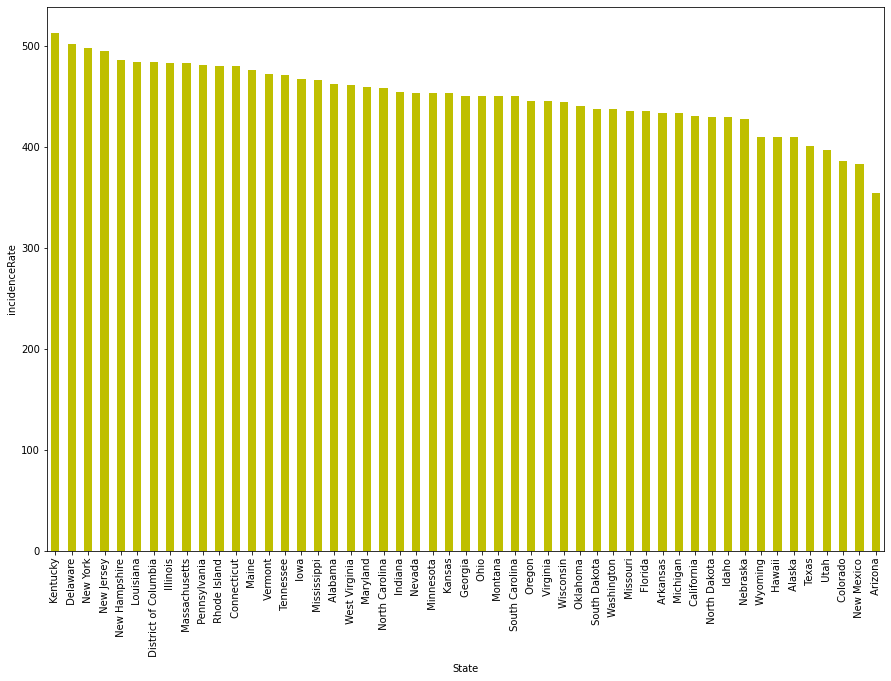

In [ ]:
state_incidence= df['incidenceRate'].groupby(df['State']).mean().sort_values(ascending=False)
plt.xlabel('State')
plt.ylabel('incidenceRate')
state_incidence.plot(kind='bar', figsize=(15,10),color='y')


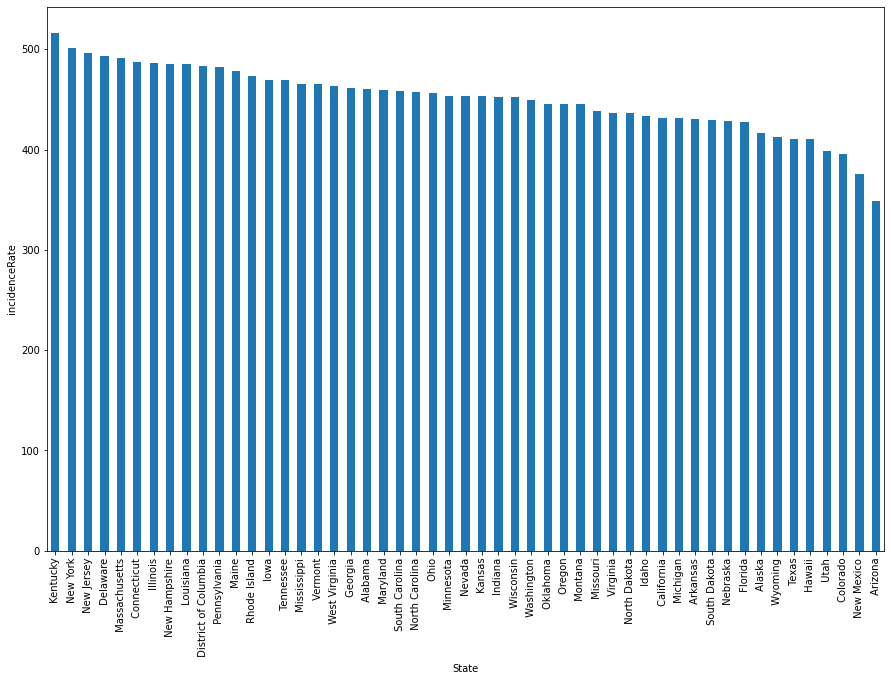

In [ ]:
state_incidence= df['incidenceRate'].groupby(df['State']).median().sort_values(ascending=False)
plt.xlabel('State')
plt.ylabel('incidenceRate')
state_incidence.plot(kind='bar', figsize=(15,10))


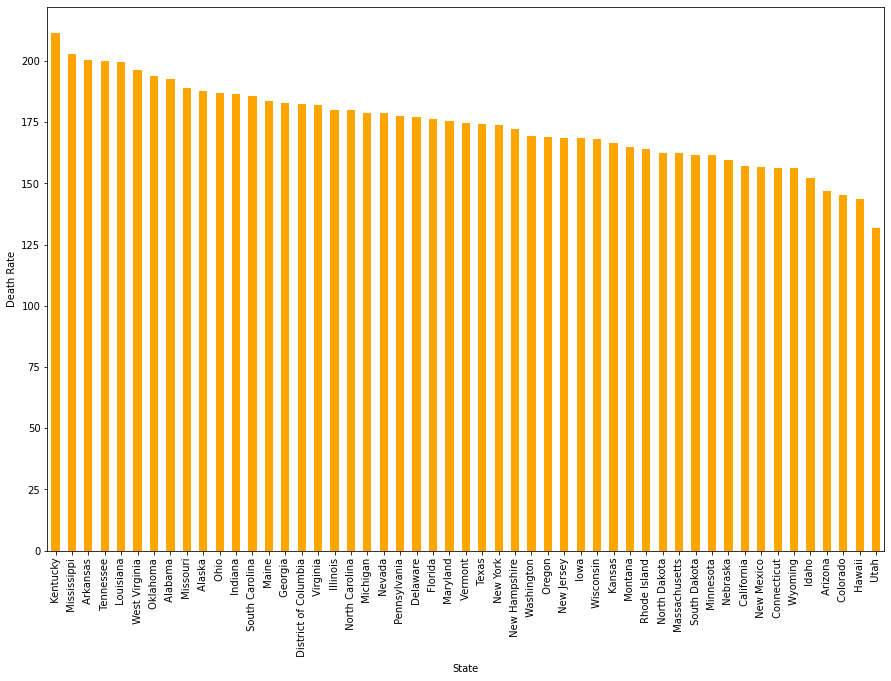

In [ ]:
state_incidence= df['TARGET_deathRate'].groupby(df['State']).median().sort_values(ascending=False)
plt.xlabel('State')
plt.ylabel('Death Rate')
state_incidence.plot(kind='bar', figsize=(15,10), color='orange')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]),
 <a list of 51 Text major ticklabel objects>)

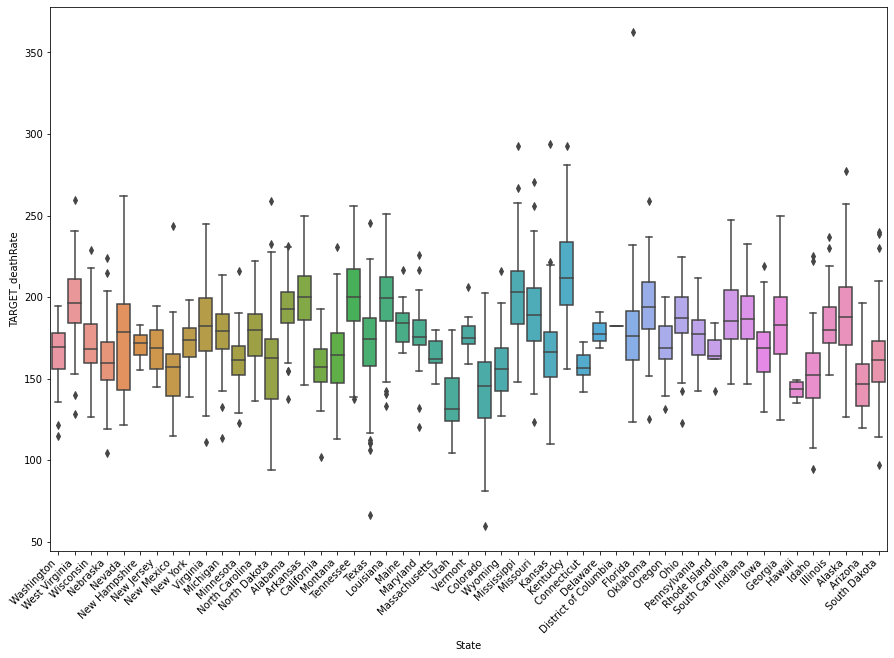

In [ ]:
plt.figure(figsize=(15,10))
sns.boxplot(data=df, x='State',y='TARGET_deathRate')
plt.xticks(rotation= 45,ha='right')

<function matplotlib.pyplot.plot(*args, scalex=True, scaley=True, data=None, **kwargs)>

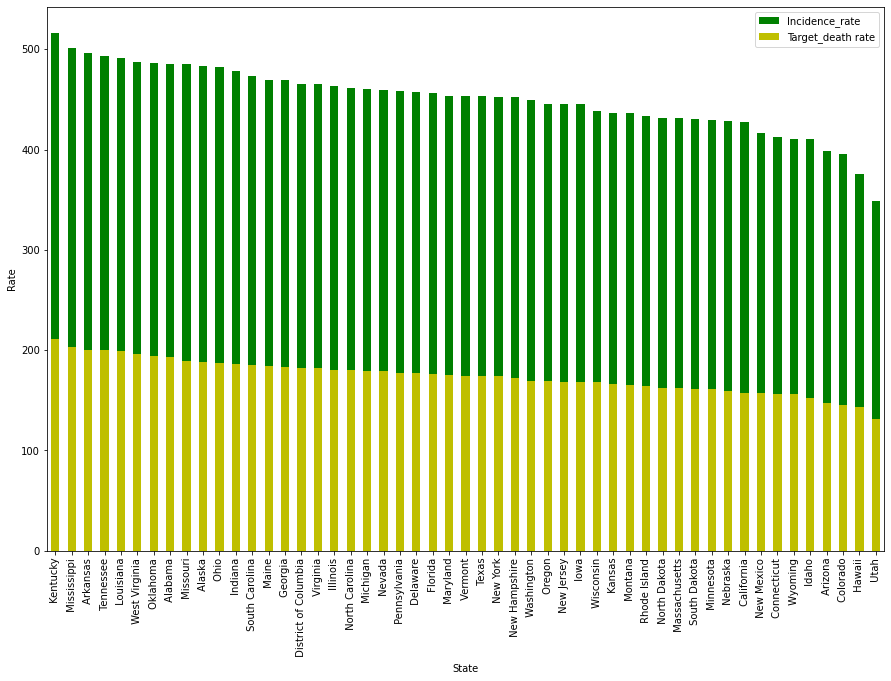

In [ ]:

c=df['incidenceRate'].groupby(df['State']).median().sort_values(ascending=False)
h=df['TARGET_deathRate'].groupby(df['State']).median().sort_values(ascending=False)

c.plot(kind='bar',figsize=(15,10),color='g',label='Incidence_rate')
h.plot(kind='bar',figsize=(15,10),color='y', label='Target_death rate')
plt.ylabel('Rate')
plt.legend()
plt.plot

In [ ]:
#num_df=df.drop(['Geography','binnedInc','County','State'],axis=1, inplace=True)
#num_df=num_df.,drop('binnedInc',axis=1,inplace=True)
#num_df=df.drop(['County','State'],axis=1,inplace=True)
#num_df.info()

In [ ]:
new_df=df.select_dtypes(include=np.number)

In [ ]:
f_cols= list(new_df.columns)

def outliers_visual(data):
  plt.figure(figsize=(15,40))
  i=0
  for col in f_cols:
    i+=1
    plt.subplot(10,4,i)
    plt.boxplot(data[col])
    plt.title('{}boxplot'.format(col ))
    i+=1
    plt.subplot(10,4,i)
    plt.hist(data[col])
    plt.title('{}histogram'.format(col ))
    
  plt.show()


ValueError: ignored

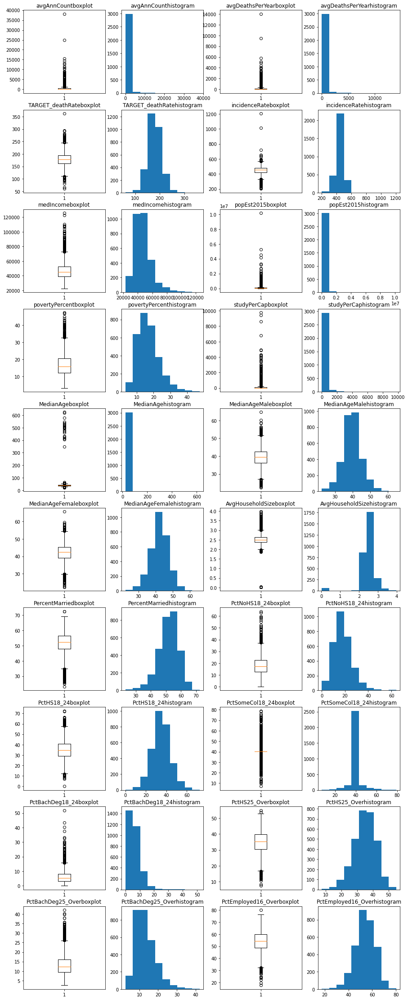

In [ ]:
outliers_visual(new_df) 

In [ ]:
def outlier_count(col, data=new_df):
    print(15*'-' + col + 15*'-')
    q75, q25 = np.percentile(data[col], [75, 25])
    iqr = q75 - q25
    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    outlier_count = len(np.where((data[col] > max_val) | (data[col] < min_val))[0])
    outlier_percent = round(outlier_count/len(data[col])*100, 2)
    print('Number of outliers: {}'.format(outlier_count))
    print('Percent of data that is outlier: {}%'.format(outlier_percent))

In [ ]:
for col in f_cols:
    outlier_count(col)

---------------avgAnnCount---------------
Number of outliers: 461
Percent of data that is outlier: 15.13%
---------------avgDeathsPerYear---------------
Number of outliers: 349
Percent of data that is outlier: 11.45%
---------------TARGET_deathRate---------------
Number of outliers: 64
Percent of data that is outlier: 2.1%
---------------incidenceRate---------------
Number of outliers: 93
Percent of data that is outlier: 3.05%
---------------medIncome---------------
Number of outliers: 122
Percent of data that is outlier: 4.0%
---------------popEst2015---------------
Number of outliers: 412
Percent of data that is outlier: 13.52%
---------------povertyPercent---------------
Number of outliers: 69
Percent of data that is outlier: 2.26%
---------------studyPerCap---------------
Number of outliers: 504
Percent of data that is outlier: 16.54%
---------------MedianAge---------------
Number of outliers: 93
Percent of data that is outlier: 3.05%
---------------MedianAgeMale---------------
Num

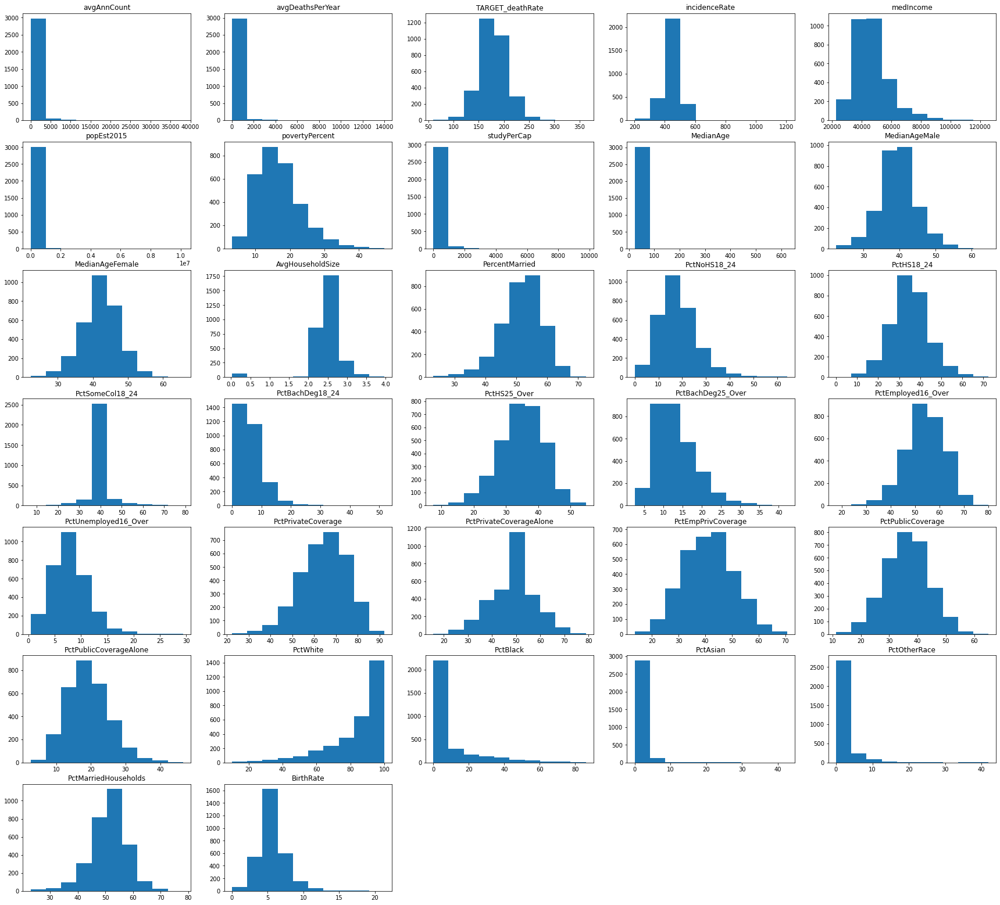

In [ ]:
plt.figure(figsize=(30, 40))
for i, col in enumerate(f_cols, 1):
    plt.subplot(10, 5, i)
    plt.hist(new_df[col])
    plt.title(col)

There are lot of outliers for all variables, including

In [ ]:
cols=f_cols
Q1 = new_df[cols].quantile(0.25)
Q3 = new_df[cols].quantile(0.75)
IQR = Q3 - Q1

no_outlier_df = new_df[~((new_df[cols] < (Q1 - 1.5 * IQR)) |(new_df[cols] > (Q3 + 1.5 * IQR))).any(axis=1)]

In [ ]:
no_outlier_df

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,45.0,44.0,...,43.5,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488
5,428.0,152,176.0,505.4,52313,61023,15.6,180.259902,45.4,43.5,...,38.8,32.6,43.2,20.2,84.882631,1.653205,1.538057,3.314635,51.220360,4.964476
8,88.0,36,190.5,459.4,42579,13088,22.3,0.000000,49.3,48.4,...,37.8,29.9,48.1,26.6,91.787477,0.185071,0.208205,0.616903,53.446998,5.587583
12,55.0,26,188.3,398.9,52673,11339,12.6,0.000000,45.2,44.9,...,49.7,42.6,36.1,20.5,93.418127,0.844970,0.978387,0.773815,52.947720,4.805592
15,251.0,106,174.2,423.8,43823,43791,19.3,0.000000,46.2,45.6,...,39.3,33.9,45.8,24.1,89.177459,0.489115,0.603931,0.865711,55.212399,3.631082
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3004,119.0,46,171.6,493.6,54957,17337,12.9,0.000000,43.0,41.7,...,57.4,48.1,32.3,14.1,88.683563,0.509182,0.263173,1.287259,56.568483,6.724330
3005,46.0,19,181.3,475.5,46501,6205,13.1,0.000000,43.7,40.9,...,49.1,38.7,37.6,17.5,95.879607,0.209239,0.611621,1.738291,55.575802,5.024311
3007,50.0,21,181.9,463.5,42555,7344,14.4,0.000000,43.9,42.8,...,48.7,37.0,38.7,19.5,97.927879,0.605490,0.242196,0.080732,60.394022,7.260963
3016,49.0,16,136.5,470.0,50286,7569,11.0,0.000000,44.8,44.8,...,56.2,46.4,35.3,16.1,97.196880,0.965225,0.158667,0.251223,53.836478,8.338679


In [ ]:
n_out_col= list(no_outlier_df.columns)
for colm in n_out_col:
    outlier_count(colm)

---------------avgAnnCount---------------
Number of outliers: 461
Percent of data that is outlier: 15.13%
---------------avgDeathsPerYear---------------
Number of outliers: 349
Percent of data that is outlier: 11.45%
---------------TARGET_deathRate---------------
Number of outliers: 64
Percent of data that is outlier: 2.1%
---------------incidenceRate---------------
Number of outliers: 93
Percent of data that is outlier: 3.05%
---------------medIncome---------------
Number of outliers: 122
Percent of data that is outlier: 4.0%
---------------popEst2015---------------
Number of outliers: 412
Percent of data that is outlier: 13.52%
---------------povertyPercent---------------
Number of outliers: 69
Percent of data that is outlier: 2.26%
---------------studyPerCap---------------
Number of outliers: 504
Percent of data that is outlier: 16.54%
---------------MedianAge---------------
Number of outliers: 93
Percent of data that is outlier: 3.05%
---------------MedianAgeMale---------------
Num

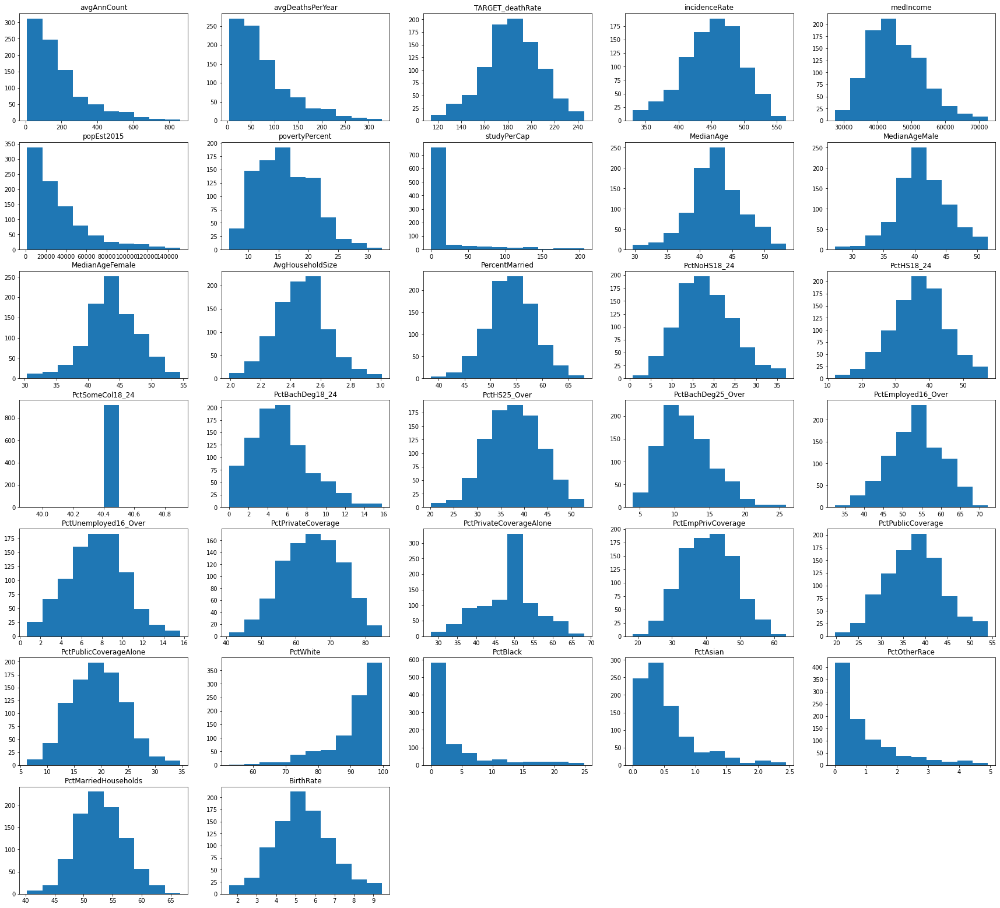

In [ ]:
plt.figure(figsize=(30, 40))
for i, colm in enumerate(n_out_col, 1):
    plt.subplot(10, 5, i)
    plt.hist(no_outlier_df[colm])
    plt.title(colm)

In [ ]:
df.corr()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
avgAnnCount,1.000000,0.939408,-0.143532,0.073553,0.269145,0.926894,-0.135694,0.082071,-0.024098,-0.124969,...,0.166670,0.202349,-0.173548,-0.093699,-0.136501,0.031376,0.435071,0.209184,-0.106221,-0.034508
avgDeathsPerYear,0.939408,1.000000,-0.090715,0.062690,0.223207,0.977634,-0.066918,0.063488,-0.024599,-0.148487,...,0.112218,0.160124,-0.131687,-0.027338,-0.187159,0.084607,0.443074,0.215149,-0.160266,-0.074420
TARGET_deathRate,-0.143532,-0.090715,1.000000,0.449432,-0.428615,-0.120073,0.429389,-0.022285,0.004375,-0.021929,...,-0.326195,-0.267399,0.404572,0.449358,-0.177400,0.257024,-0.186331,-0.189894,-0.293325,-0.087407
incidenceRate,0.073553,0.062690,0.449432,1.000000,-0.001036,0.026912,0.009046,0.077283,0.018089,-0.014733,...,0.098707,0.149825,0.046109,0.040812,-0.014510,0.113489,-0.008123,-0.208748,-0.152176,-0.118181
medIncome,0.269145,0.223207,-0.428615,-0.001036,1.000000,0.235523,-0.788965,0.044003,-0.013288,-0.091663,...,0.706971,0.747294,-0.754822,-0.719756,0.167225,-0.270232,0.425844,0.083635,0.446083,-0.010195
popEst2015,0.926894,0.977634,-0.120073,0.026912,0.235523,1.000000,-0.065299,0.055722,-0.025219,-0.176608,...,0.121343,0.158650,-0.160066,-0.041469,-0.190095,0.073044,0.464168,0.241468,-0.127979,-0.057740
povertyPercent,-0.135694,-0.066918,0.429389,0.009046,-0.788965,-0.065299,1.000000,-0.055652,-0.029280,-0.214001,...,-0.682822,-0.683100,0.651162,0.798642,-0.509433,0.511530,-0.157289,0.047096,-0.604953,-0.012283
studyPerCap,0.082071,0.063488,-0.022285,0.077283,0.044003,0.055722,-0.055652,1.000000,-0.026030,-0.036647,...,0.068458,0.100063,-0.051497,-0.055512,0.023291,-0.019761,0.062543,-0.015247,-0.051736,0.010676
MedianAge,-0.024098,-0.024599,0.004375,0.018089,-0.013288,-0.025219,-0.029280,-0.026030,1.000000,0.129119,...,-0.021388,-0.036926,0.049060,-0.003298,0.035009,-0.017173,-0.038424,-0.030277,0.014504,-0.008276
MedianAgeMale,-0.124969,-0.148487,-0.021929,-0.014733,-0.091663,-0.176608,-0.214001,-0.036647,0.129119,1.000000,...,-0.147777,-0.208664,0.398967,0.002479,0.398044,-0.242748,-0.238322,-0.266655,0.222278,-0.104105


In [ ]:
#mask = np.triu(df[f_cols].corr())  #(The triu() function is used to get a copy of a matrix with the elements below the k-th diagonal zeroed.)
#plt.figure(figsize=(30,20))
#sns.heatmap(df[f_cols].corr(), annot=True, fmt='.2g', vmin=-1, vmax=1, center=0, cmap='coolwarm', mask=mask)
#plt.ylim(30,0) #(y limit determines the scale on y access and thus the number of feature columns)
#plt.title('Correlation Matrix Heatmap')
#plt.show() 
#( blue show most correlation)

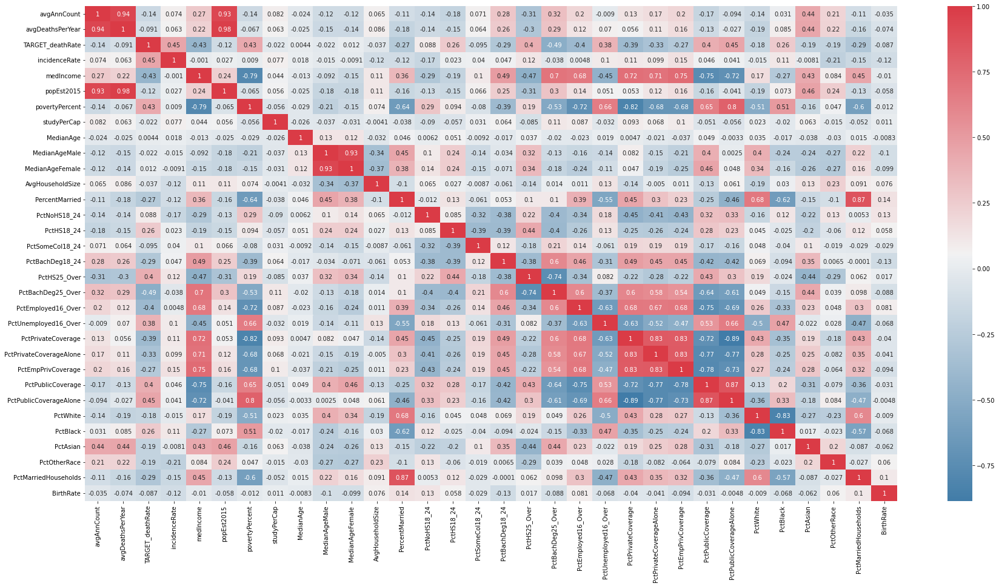

In [ ]:
cmap = sns.diverging_palette( 240 , 10 , as_cmap = True )
plt.figure(figsize=(30,15))
sns.heatmap(df.corr(),cmap=cmap,annot=True)


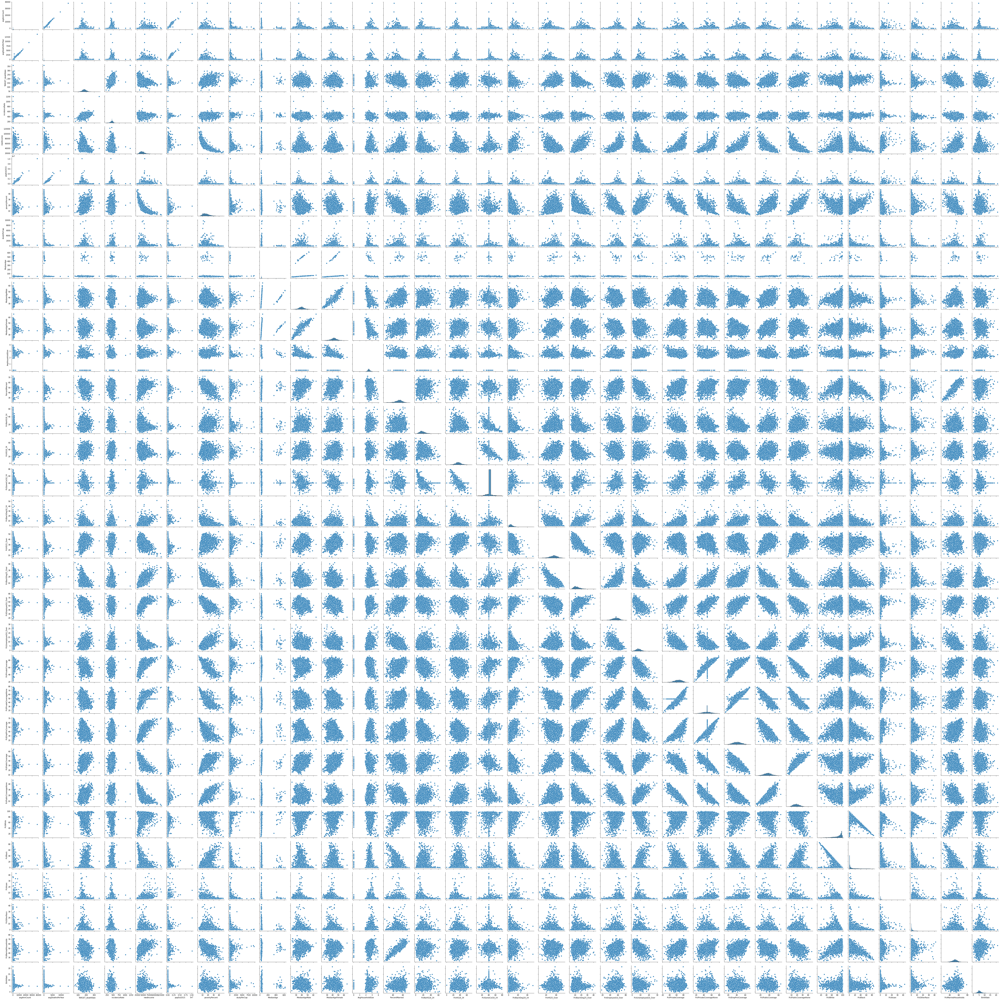

In [ ]:
sns.pairplot(df)
#his creates a nice visualisation and helps us understand the data by summarising
# a large amount of data in a single figure. This is essential when we are exploring our dataset and trying to become familiar with it

In [ ]:
cols_to_plot = ['TARGET_deathRate','avgDeathsPerYear','incidenceRate','popEst2015','povertyPercent','MedianAgeMale','MedianAgeFemale','PctPrivateCoverage','PctPublicCoverageAlone']

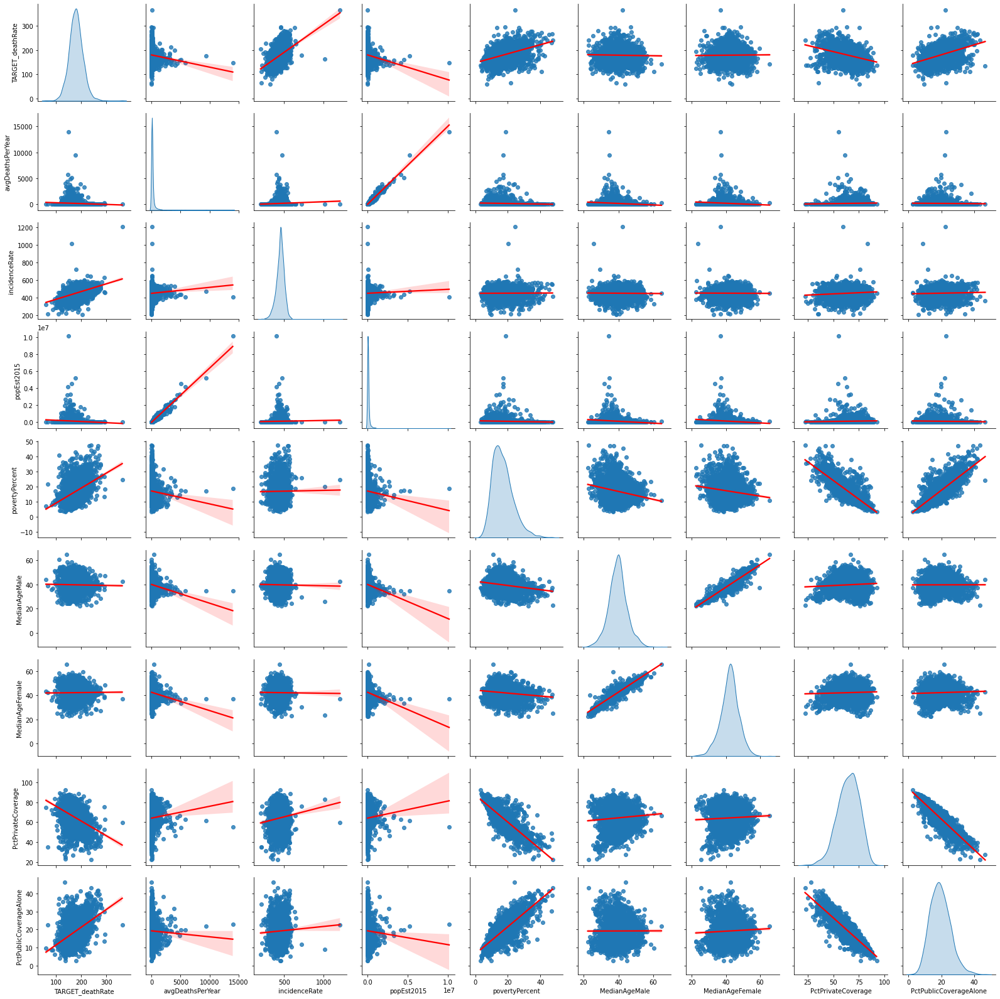

In [ ]:
sns.pairplot(df[cols_to_plot], kind='reg', diag_kind='kde',
             plot_kws={'line_kws':{'color':'red'}})

A simple method to detect multicollinearity in a model is by using something called the variance inflation factor or the VIF for each predicting variable.

A VIF of 1

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
new_df.dropna()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
0,1397.000000,469,164.9,489.800000,61898,260131,11.2,499.748204,39.3,36.9,...,48.7,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831
1,173.000000,70,161.3,411.600000,48127,43269,18.6,23.111234,33.0,32.2,...,53.8,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096
2,102.000000,50,174.7,349.700000,49348,21026,14.6,47.560164,45.0,44.0,...,43.5,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488
3,427.000000,202,194.8,430.400000,44243,75882,17.1,342.637253,42.8,42.2,...,40.3,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841
4,57.000000,26,144.4,350.100000,49955,10321,12.5,0.000000,48.3,47.8,...,43.9,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3042,1962.667684,15,149.6,453.549422,46961,6343,12.4,0.000000,44.2,41.1,...,54.9,44.6,31.7,13.2,90.280811,3.837754,0.327613,1.700468,51.063830,7.773512
3043,1962.667684,43,150.1,453.549422,48609,37118,18.8,377.175494,30.4,29.3,...,53.3,48.6,28.8,17.7,75.706245,2.326771,4.044920,14.130288,52.007937,8.186470
3044,1962.667684,46,153.9,453.549422,51144,34536,15.0,1968.959926,30.9,30.5,...,52.6,47.8,26.6,16.8,87.961629,2.313188,1.316472,5.680705,55.153949,7.809192
3045,1962.667684,52,175.0,453.549422,50745,25609,13.3,0.000000,39.0,36.9,...,56.3,49.6,29.5,14.0,92.905681,1.176562,0.244632,2.131790,58.484232,7.582938


In [ ]:

X_variables = new_df.drop('TARGET_deathRate',axis=1)


In [ ]:
vif_data = pd.DataFrame()
vif_data["feature"] = X_variables.columns
vif_data["VIF"] = [variance_inflation_factor(X_variables.values, i) for i in range(len(X_variables.columns))]